In [1]:
# Import Libraries 
import pandas as pd 
import numpy as np 
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns

# Read csv file

In [2]:
df = pd.read_csv('Telecom_challenge_dataset.csv')

In [3]:
df

,Unnamed: 0,Number_of_xDR_Sessions,Start,Start ms,End,End ms,Session_Duration,IMSI,MSISDN/Number,IMEI,...,Total_UL,Total_DL,Social_Media_Total,Google_Total,Email_Total,Youtube_Total,Netflix_Total,Gaming_Total,Other_Total,Decile
0,62,1.304243e+19,4/21/2019 2:55,73.0,4/25/2019 0:17,262.0,336160.0,2.082018e+14,3.376353e+10,8.637690e+13,...,46797611.0,632600264.0,2306304.0,12508343.0,2947986.0,33785357.0,27059520.0,586723162.0,461046993.0,9
1,65,1.311448e+19,4/21/2019 8:26,605.0,4/25/2019 1:20,655.0,320001.0,2.082017e+14,3.366364e+10,3.564211e+13,...,18261248.0,597244693.0,2079990.0,10947068.0,2016170.0,24438238.0,21198618.0,553525983.0,143391779.0,9
2,66,7.349883e+18,4/21/2019 8:54,105.0,4/25/2019 0:48,931.0,316419.0,2.082019e+14,3.366010e+10,3.579881e+13,...,50065095.0,538809148.0,2788022.0,4124132.0,1921045.0,26221282.0,33016593.0,517411244.0,351957444.0,9
3,67,1.311448e+19,4/21/2019 9:19,590.0,4/25/2019 4:42,965.0,329003.0,2.082021e+14,3.365079e+10,3.575751e+13,...,29436200.0,162196572.0,1587744.0,12497259.0,633163.0,23264606.0,21560614.0,126031552.0,489909991.0,9
4,68,1.304243e+19,4/21/2019 10:09,1.0,4/25/2019 1:39,272.0,314961.0,2.082014e+14,3.366274e+10,3.528141e+13,...,50576233.0,93360974.0,2488677.0,3504964.0,1399164.0,41043086.0,26529939.0,62498650.0,531681682.0,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
125552,149994,1.311448e+19,4/29/2019 7:28,83.0,4/30/2019 15:01,268.0,113545.0,2.082003e+14,3.364566e+10,3.515541e+13,...,59377936.0,862796008.0,892867.0,8922614.0,1565542.0,42219856.0,28354119.0,825524976.0,792559807.0,6
125553,149996,7.277826e+18,4/29/2019 7:28,451.0,4/30/2019 6:02,214.0,81230.0,2.082022e+14,3.365069e+10,3.548311e+13,...,57628851.0,574175259.0,3517065.0,12784914.0,690876.0,27955095.0,37561864.0,535806880.0,16751926.0,3
125554,149997,7.349883e+18,4/29/2019 7:28,483.0,4/30/2019 10:41,187.0,97970.0,2.082019e+14,3.366345e+10,3.566051e+13,...,39135081.0,666648844.0,2352181.0,4415361.0,2121718.0,22165518.0,40643294.0,631628095.0,714638145.0,5
125555,149998,1.311448e+19,4/29/2019 7:28,283.0,4/30/2019 10:46,810.0,98249.0,2.082017e+14,3.362189e+10,3.572121e+13,...,34912224.0,592786405.0,1260239.0,6585469.0,2058277.0,24516413.0,15029702.0,566933800.0,132415585.0,5


In [5]:
df.sample(4)

,Unnamed: 0,Number_of_xDR_Sessions,Start,Start ms,End,End ms,Session_Duration,IMSI,MSISDN/Number,IMEI,...,Total_UL,Total_DL,Social_Media_Total,Google_Total,Email_Total,Youtube_Total,Netflix_Total,Gaming_Total,Other_Total,Decile
83303,99919,7.277826e+18,4/27/2019 17:27,465.0,4/28/2019 1:45,322.0,29875.0,2.082010e+14,3.366743e+10,3.557661e+13,...,31327852.0,290511798.0,2867845.0,12198413.0,2382062.0,23980632.0,31641040.0,236773445.0,234315373.0,1
115406,137297,1.304243e+19,4/29/2019 1:37,270.0,4/30/2019 1:37,201.0,86399.0,2.082014e+14,3.366666e+10,3.586241e+13,...,29071142.0,359046859.0,1674942.0,7236420.0,4321125.0,7744642.0,25970659.0,337075813.0,577797508.0,3
31381,38597,1.304243e+19,4/25/2019 2:57,526.0,4/26/2019 2:57,578.0,86400.0,2.082014e+14,3.376356e+10,8.637690e+13,...,50752344.0,318242170.0,164946.0,6934579.0,3474519.0,21442879.0,30541160.0,297432602.0,223706672.0,4
52647,63644,7.349883e+18,4/26/2019 6:41,614.0,4/27/2019 9:06,326.0,95122.0,2.082003e+14,3.377173e+10,3.586241e+13,...,52758035.0,749765412.0,2714993.0,13826503.0,3493759.0,27289408.0,33925448.0,712724955.0,469968280.0,5


In [6]:
df = df.drop(['Unnamed: 0'],axis=1)

,Number_of_xDR_Sessions,Start,Start ms,End,End ms,Session_Duration,IMSI,MSISDN/Number,IMEI,Last Location Name,...,Total_UL,Total_DL,Social_Media_Total,Google_Total,Email_Total,Youtube_Total,Netflix_Total,Gaming_Total,Other_Total,Decile
0,1.304243e+19,4/21/2019 2:55,73.0,4/25/2019 0:17,262.0,336160.0,2.082018e+14,3.376353e+10,8.637690e+13,D72939C,...,46797611.0,632600264.0,2306304.0,12508343.0,2947986.0,33785357.0,27059520.0,586723162.0,461046993.0,9
1,1.311448e+19,4/21/2019 8:26,605.0,4/25/2019 1:20,655.0,320001.0,2.082017e+14,3.366364e+10,3.564211e+13,L11120C,...,18261248.0,597244693.0,2079990.0,10947068.0,2016170.0,24438238.0,21198618.0,553525983.0,143391779.0,9
2,7.349883e+18,4/21/2019 8:54,105.0,4/25/2019 0:48,931.0,316419.0,2.082019e+14,3.366010e+10,3.579881e+13,L11864B,...,50065095.0,538809148.0,2788022.0,4124132.0,1921045.0,26221282.0,33016593.0,517411244.0,351957444.0,9
3,1.311448e+19,4/21/2019 9:19,590.0,4/25/2019 4:42,965.0,329003.0,2.082021e+14,3.365079e+10,3.575751e+13,D73388C,...,29436200.0,162196572.0,1587744.0,12497259.0,633163.0,23264606.0,21560614.0,126031552.0,489909991.0,9
4,1.304243e+19,4/21/2019 10:09,1.0,4/25/2019 1:39,272.0,314961.0,2.082014e+14,3.366274e+10,3.528141e+13,T72937C,...,50576233.0,93360974.0,2488677.0,3504964.0,1399164.0,41043086.0,26529939.0,62498650.0,531681682.0,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
125552,1.311448e+19,4/29/2019 7:28,83.0,4/30/2019 15:01,268.0,113545.0,2.082003e+14,3.364566e+10,3.515541e+13,T88383B,...,59377936.0,862796008.0,892867.0,8922614.0,1565542.0,42219856.0,28354119.0,825524976.0,792559807.0,6
125553,7.277826e+18,4/29/2019 7:28,451.0,4/30/2019 6:02,214.0,81230.0,2.082022e+14,3.365069e+10,3.548311e+13,D20434A,...,57628851.0,574175259.0,3517065.0,12784914.0,690876.0,27955095.0,37561864.0,535806880.0,16751926.0,3
125554,7.349883e+18,4/29/2019 7:28,483.0,4/30/2019 10:41,187.0,97970.0,2.082019e+14,3.366345e+10,3.566051e+13,D10223C,...,39135081.0,666648844.0,2352181.0,4415361.0,2121718.0,22165518.0,40643294.0,631628095.0,714638145.0,5
125555,1.311448e+19,4/29/2019 7:28,283.0,4/30/2019 10:46,810.0,98249.0,2.082017e+14,3.362189e+10,3.572121e+13,T51102A,...,34912224.0,592786405.0,1260239.0,6585469.0,2058277.0,24516413.0,15029702.0,566933800.0,132415585.0,5


# Data Aggregation per customer 

In [7]:
df.columns

Index(['Unnamed: 0', 'Number_of_xDR_Sessions', 'Start', 'Start ms', 'End',
       'End ms', 'Session_Duration', 'IMSI', 'MSISDN/Number', 'IMEI',
       'Last Location Name', 'Avg RTT DL (ms)', 'Avg RTT UL (ms)',
       'Avg Bearer TP DL (kbps)', 'Avg Bearer TP UL (kbps)',
       'TCP DL Retrans. Vol (Bytes)', 'TCP UL Retrans. Vol (Bytes)',
       'DL TP < 50 Kbps (%)', '50 Kbps < DL TP < 250 Kbps (%)',
       '250 Kbps < DL TP < 1 Mbps (%)', 'DL TP > 1 Mbps (%)',
       'UL TP < 10 Kbps (%)', '10 Kbps < UL TP < 50 Kbps (%)',
       '50 Kbps < UL TP < 300 Kbps (%)', 'UL TP > 300 Kbps (%)',
       'HTTP DL (Bytes)', 'HTTP UL (Bytes)', 'Activity Duration DL (ms)',
       'Activity Duration UL (ms)', 'Dur. (ms).1', 'Handset Manufacturer',
       'Handset Type', 'Nb of sec with 125000B < Vol DL',
       'Nb of sec with 1250B < Vol UL < 6250B',
       'Nb of sec with 31250B < Vol DL < 125000B',
       'Nb of sec with 37500B < Vol UL',
       'Nb of sec with 6250B < Vol DL < 31250B',
       '

In [9]:
#Replace missing value with mean or mode 
numeric_columns = ['Avg RTT DL (ms)','Avg RTT UL (ms)','Avg Bearer TP DL (kbps)','Avg Bearer TP UL (kbps)','TCP DL Retrans. Vol (Bytes)',
                   'TCP UL Retrans. Vol (Bytes)','Activity Duration UL (ms)','Activity Duration DL (ms)']
categorical_columns = ['Handset Manufacturer','Handset Type']

for column in numeric_columns: 
    df[column].fillna(df[column].mean(),inplace=True)

for column in categorical_columns: 
    df[column].fillna(df[column].mode()[0],inplace=True)

In [10]:
# Aggregate data per customer 
df_agg = df.groupby('MSISDN/Number').agg({
    'Avg RTT DL (ms)':'mean',
   'Avg RTT UL (ms)':'mean',
    'Avg Bearer TP DL (kbps)':'mean',
    'Avg Bearer TP UL (kbps)':'mean',
    'TCP DL Retrans. Vol (Bytes)':'mean',
    'TCP UL Retrans. Vol (Bytes)':'mean',
    'Activity Duration UL (ms)':'mean',
    'Activity Duration DL (ms)':'mean',
    'Handset Manufacturer': lambda x:x.mode()[0],
    'Handset Type': lambda x:x.mode()[0]          #Assuming each customer uses handset type
}).reset_index()

In [13]:
# Comupte average TCP retransmission and average RTT with feature engineering
df_agg['Avg RTT']  = df_agg['Avg RTT DL (ms)'] + df_agg['Avg RTT UL (ms)']
df_agg['Avg Bearer TP']  = df_agg['Avg Bearer TP DL (kbps)'] + df_agg['Avg Bearer TP UL (kbps)']
df_agg['Avg TCP Retrans'] = df['TCP DL Retrans. Vol (Bytes)'] + df_agg['TCP UL Retrans. Vol (Bytes)']
df_agg['Avg Activity Duration'] = df['Activity Duration UL (ms)'] + df_agg['Activity Duration DL (ms)']

In [19]:
# Compute & list 10 of the top bottom and most frequent values 
metrics = ['Avg RTT','Avg Bearer TP','Avg TCP Retrans','Avg Activity Duration']

for metric in metrics: 
    print(f"\nTop 10 {metric}:")
    print(df_agg[metric].nlargest(10).values)
    print(f"\nBottom 10 {metric}:")
    print(df_agg[metric].nsmallest(10).values)
    print(f"\n10 Most frequent{metric}:")
    print(df_agg[metric].value_counts().head(10).index.tolist())


Top 10 Avg RTT:
[1907. 1805. 1778. 1772. 1771. 1771. 1770. 1770. 1769. 1769.]

Bottom 10 Avg RTT:
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]

10 Most frequentAvg RTT:
[0.0, 29.0, 39.0, 30.0, 38.0, 40.0, 28.0, 49.0, 31.0, 41.0]

Top 10 Avg Bearer TP:
[99110. 98075. 98063. 97271. 96660. 96602. 96496. 96249. 95869. 95859.]

Bottom 10 Avg Bearer TP:
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]

10 Most frequentAvg Bearer TP:
[15.0, 63.0, 97.0, 90.0, 98.0, 96.0, 99.0, 89.0, 91.0, 93.0]

Top 10 Avg TCP Retrans:
[3.23967418e+08 3.19446151e+08 3.15373780e+08 3.01392685e+08
 2.94588955e+08 2.69828695e+08 2.65376860e+08 2.57719023e+08
 2.48478163e+08 2.44671366e+08]

Bottom 10 Avg TCP Retrans:
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]

10 Most frequentAvg TCP Retrans:
[0.0, 1330.0, 2660.0, 3990.0, 1294.0, 1318.0, 665.0, 5320.0, 6650.0, 38.0]

Top 10 Avg Activity Duration:
[24568875.  24553119.  23731344.  23510942.  22746565.5 22417153.
 21561698.  21436569.  21311046.  21093247. ]

Bottom 10 Avg Activity Duration:
[0. 0. 0. 0.

# Distribution and average views by handset type 

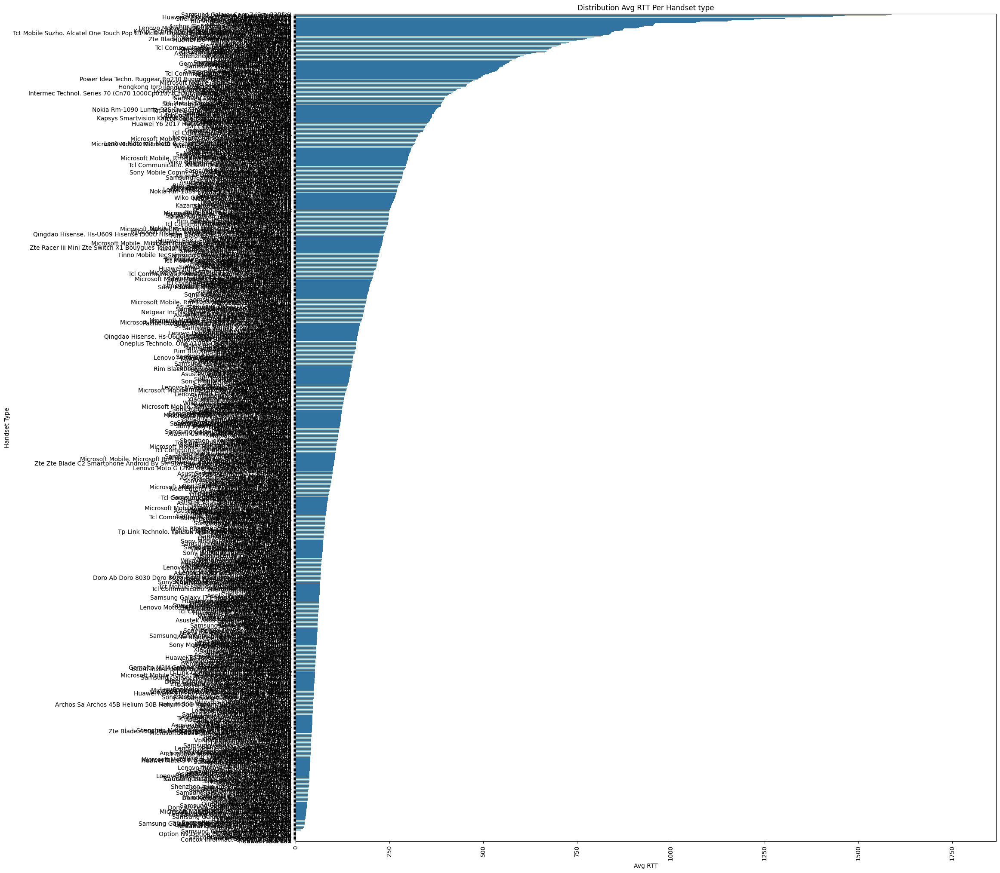

In [68]:
# Distribution of average throughput per handset type
Avg_RTT_Handset = df_agg.groupby('Handset Type')['Avg RTT'].mean().reset_index()

# Plot the distribution
plt.figure(figsize=(21,25))
sns.barplot(x='Avg RTT', y='Handset Type', data=Avg_RTT_Handset.sort_values(by='Avg RTT', ascending=False))
plt.title('Distribution Avg RTT Per Handset type')
plt.xlabel('Avg RTT')
plt.ylabel('Handset Type')
plt.xticks(rotation=90)
plt.show()

n\Average RTT Per Handset Type:
                                           Handset Type      Avg RTT
0                            A-Link Telecom I. Cubot A5    42.000000
1                     A-Link Telecom I. Cubot Note Plus  1589.000000
2                          A-Link Telecom I. Cubot Nova    44.000000
3                         A-Link Telecom I. Cubot Power    43.000000
4                            A-Link Telecom I. Cubot R9   231.000000
...                                                 ...          ...
1272    Zte Blade V8 Lite Blade V8 Lite Zte Blade V8 Se   776.000000
1273                                          Zte Mf259   122.166667
1274  Zte Racer Iii Mini Zte Switch X1 Bouygues Tele...   227.400000
1275  Zte Zte Blade C2 Smartphone Android By Sfr Sta...   102.000000
1276                                          undefined    42.397047

[1277 rows x 2 columns]


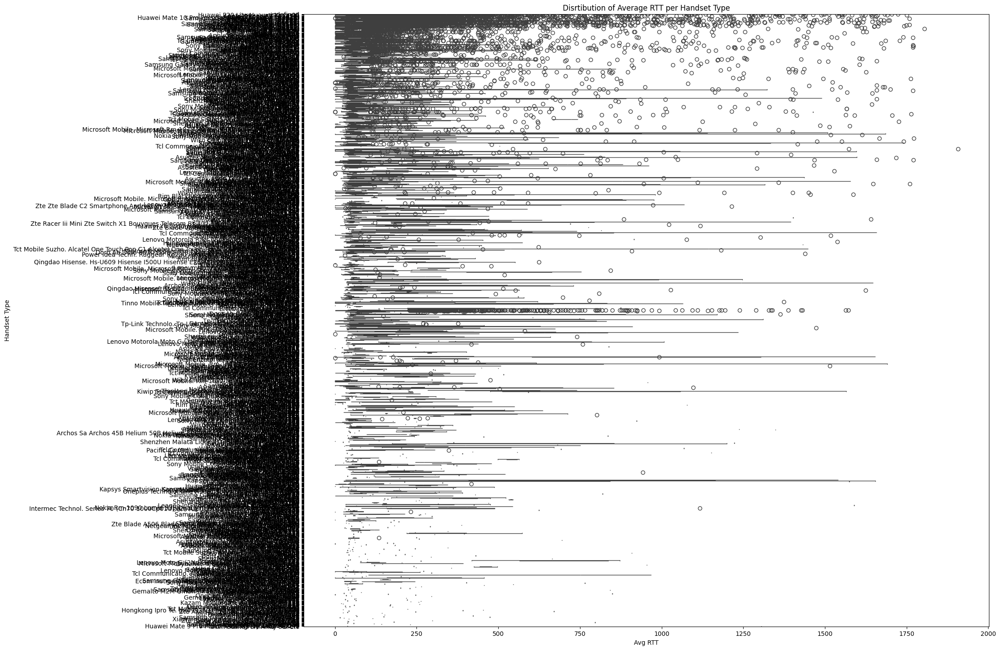

In [86]:
#Distribution Of Average throught per handset type 
avg_RTT_Handset = df_agg.groupby('Handset Type')['Avg RTT'].mean()
print("n\Average RTT Per Handset Type:")
print(Avg_RTT_Handset)

#plot the distribution 
plt.figure(figsize=(20,18))
sns.boxplot(data=df_agg, x= 'Avg RTT',y= 'Handset Type')
plt.xlabel('Avg RTT')
plt.ylabel('Handset Type')
plt.title('Disrtibution of Average RTT per Handset Type')
plt.show()

n\Average bearer TP per handset type:
Handset Type
A-Link Telecom I. Cubot A5                                                               23510.000000
A-Link Telecom I. Cubot Note Plus                                                         6699.000000
A-Link Telecom I. Cubot Nova                                                             56217.000000
A-Link Telecom I. Cubot Power                                                            69468.000000
A-Link Telecom I. Cubot R9                                                                4039.000000
                                                                                             ...     
Zte Blade V8 Lite Blade V8 Lite Zte Blade V8 Se                                           2644.000000
Zte Mf259                                                                                  115.166667
Zte Racer Iii Mini Zte Switch X1 Bouygues Telecom Bs 402 Blade Q Mini Zte Blade G Pro     1549.000000
Zte Zte Blade C2 Smartphone And

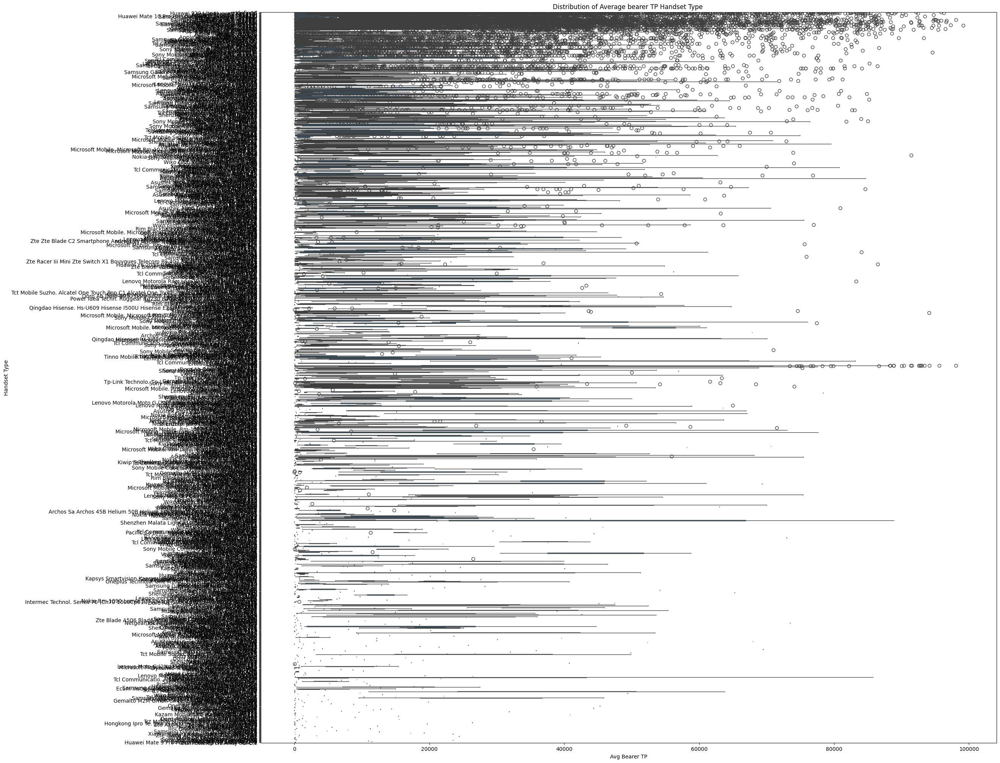

In [63]:
#Distribution of Average Bearer TP per handset type 
avg_bearer_TP_Handset = df_agg.groupby('Handset Type')['Avg Bearer TP'].mean()
print("n\Average bearer TP per handset type:")
print(avg_bearer_TP_Handset)

#plot the distribution by boxplot
plt.figure(figsize=(25,25))
sns.boxplot(data=df_agg,x='Avg Bearer TP', y='Handset Type')
plt.xlabel('Avg Bearer TP')
plt.ylabel('Handset Type')
plt.title('Distribution of Average bearer TP Handset Type ')
plt.show()


Average Throughput per Handset Type:
Handset Type
A-Link Telecom I. Cubot A5                                                                    0.000000
A-Link Telecom I. Cubot Note Plus                                                         13864.000000
A-Link Telecom I. Cubot Nova                                                               1330.000000
A-Link Telecom I. Cubot Power                                                               242.000000
A-Link Telecom I. Cubot R9                                                                14318.000000
                                                                                             ...      
Zte Blade V8 Lite Blade V8 Lite Zte Blade V8 Se                                           39042.000000
Zte Mf259                                                                                118719.000000
Zte Racer Iii Mini Zte Switch X1 Bouygues Telecom Bs 402 Blade Q Mini Zte Blade G Pro      6903.600000
Zte Zte Blade C2 Smart

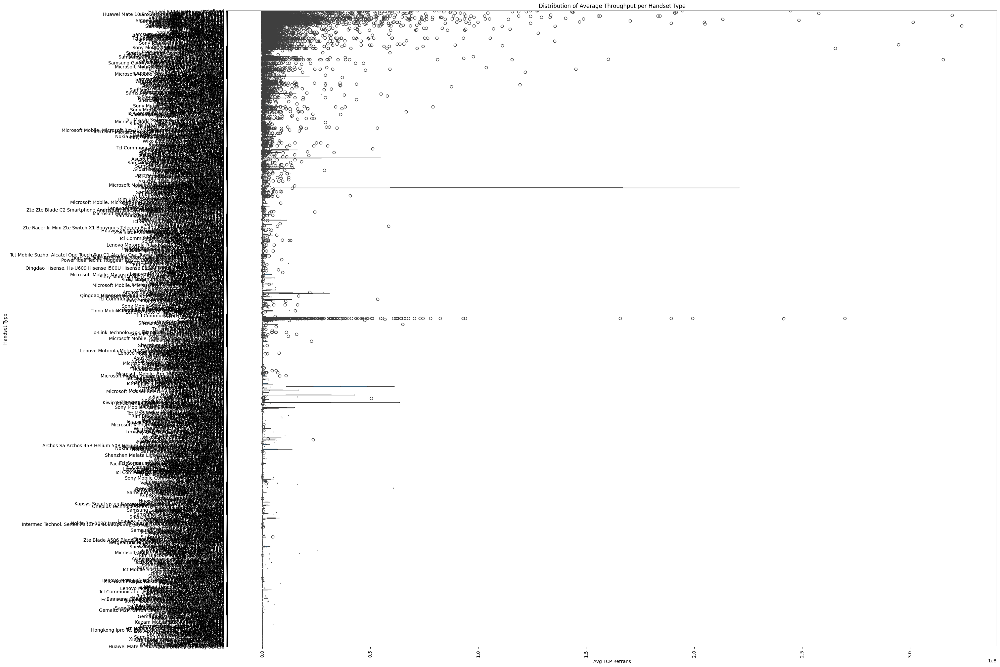

In [62]:
#Distribution of Average TCP Retrans per Handset type
avg_throughput_handset = df_agg.groupby('Handset Type')['Avg TCP Retrans'].mean()
print("\nAverage Throughput per Handset Type:")
print(avg_throughput_handset) 

#plot the distribution by  boxplot
plt.figure(figsize=(30,25))
sns.boxplot(data=df_agg, x='Avg TCP Retrans', y='Handset Type')
plt.xticks(rotation=90)
plt.title('Distribution of Average Throughput per Handset Type')
plt.show()

n\Average Activity Duration per Hanset Type
Handset Type
A-Link Telecom I. Cubot A5                                                               1.219690e+05
A-Link Telecom I. Cubot Note Plus                                                        4.814720e+05
A-Link Telecom I. Cubot Nova                                                             3.320090e+05
A-Link Telecom I. Cubot Power                                                            1.533520e+05
A-Link Telecom I. Cubot R9                                                               4.279820e+05
                                                                                             ...     
Zte Blade V8 Lite Blade V8 Lite Zte Blade V8 Se                                          8.153640e+05
Zte Mf259                                                                                2.857866e+06
Zte Racer Iii Mini Zte Switch X1 Bouygues Telecom Bs 402 Blade Q Mini Zte Blade G Pro    1.576434e+05
Zte Zte Blade C2 Smartpho

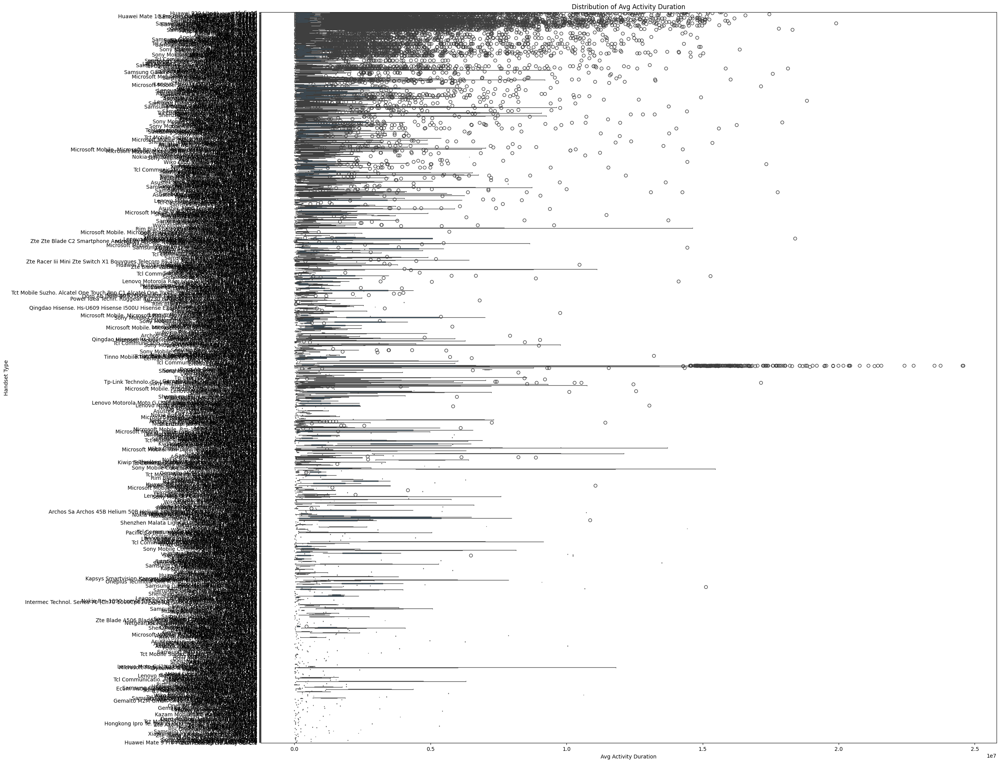

In [67]:
#Distribution of Average Activity Duration per Handset type 
avg_activity_duration = df_agg.groupby('Handset Type')['Avg Activity Duration'].mean()
print("n\Average Activity Duration per Hanset Type")
print(avg_activity_duration)

#Plot the distribution by boxplot
plt.figure(figsize=(25,25))
sns.boxplot(data=df_agg, x='Avg Activity Duration', y='Handset Type')
plt.xlabel('Avg Activity Duration')
plt.ylabel('Handset Type')
plt.title('Distribution of Avg Activity Duration')
plt.show()

# K-means Clustring

In [74]:
kmeans_data = df_agg[['Avg RTT','Avg Bearer TP','Avg TCP Retrans','Avg Activity Duration']]
kmeans = KMeans(n_clusters=3,random_state=42).fit(kmeans_data)
df_agg['cluster'] = kmeans.labels_

# Display the DataFrame with the cluster labels
print(df_agg)

       MSISDN/Number  Avg RTT DL (ms)  Avg RTT UL (ms)  \
0       0.000000e+00        60.051345        14.283619   
1       3.360100e+10        46.000000         0.000000   
2       3.360100e+10        30.000000         1.000000   
3       3.360100e+10         0.000000         0.000000   
4       3.360101e+10        69.000000        15.000000   
...              ...              ...              ...   
95250   3.378996e+10         0.000000         0.000000   
95251   3.378997e+10        48.000000         5.000000   
95252   3.378998e+10         0.000000         0.000000   
95253   3.379000e+10        42.000000        10.000000   
95254   3.379000e+10        34.000000         6.000000   

       Avg Bearer TP DL (kbps)  Avg Bearer TP UL (kbps)  \
0                 16710.132029               1376.96088   
1                    37.000000                 39.00000   
2                    48.000000                 51.00000   
3                    48.000000                 49.00000   
4       

In [76]:
#Description of each cluster
for cluster in range(3):
    print(f"\nCluster {cluster} Description:")
    cluster_data = df_agg[df_agg['cluster'] == cluster]
    print(cluster_data.describe)


Cluster 0 Description:
<bound method NDFrame.describe of        MSISDN/Number  Avg RTT DL (ms)  Avg RTT UL (ms)  \
15      3.360103e+10              0.0              0.0   
79      3.360117e+10              0.0              0.0   
80      3.360117e+10              0.0              0.0   
101     3.360121e+10             27.0              0.0   
135     3.360128e+10             27.0              5.0   
...              ...              ...              ...   
93760   3.378318e+10             48.0              1.0   
93866   3.378337e+10              0.0              0.0   
94628   3.378651e+10             71.0              0.5   
94702   3.378679e+10             34.0              6.0   
94929   3.378782e+10            302.0             11.0   

       Avg Bearer TP DL (kbps)  Avg Bearer TP UL (kbps)  \
15                        44.0                     54.0   
79                        53.0                     58.0   
80                         6.0                      9.0   
101      

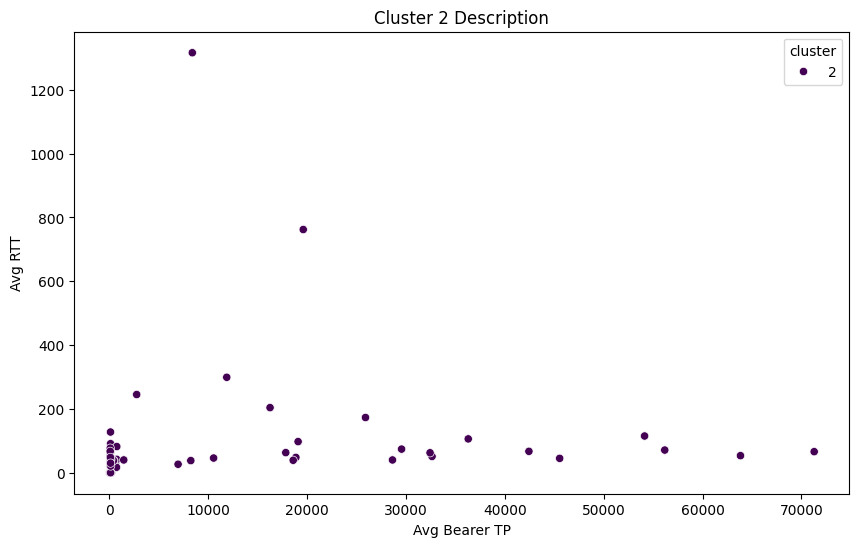

In [80]:
#Ploting cluster data 
plt.figure(figsize=(10,6))
sns.scatterplot(data= cluster_data, x='Avg Bearer TP', y= 'Avg RTT',hue= 'cluster',palette='viridis')
plt.title(f'Cluster {cluster} Description')
plt.show()

In [87]:
df_agg.to_csv('Experiance_Analytics_data.csv',index=False)